In [1]:
import missionbio.mosaic
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import sclib.mission
import sclib.gpu
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy import stats
from scipy.spatial import distance
from scipy.cluster import hierarchy
from hdbscan import HDBSCAN, all_points_membership_vectors
import umap
import ete3
import pickle
import scanpy
from matplotlib import cm, colors
import warnings
from sklearn.metrics import nan_euclidean_distances
from typing import Any, Dict, List, Optional, Sequence, Tuple, Union

In [2]:
paper_pal = {'WT': '#b3b3b3', # Anti-Flash White
 'NOTCH1': '#5d8aa8', # Air Force Blue
 'NOTCH3': '#e32636', # Alizarin Crimson 
 'NOTCH2': '#8fbc8f', # Dark Sea Green
 'FAT1': '#ffe135', # Banana Yellow
 'TP53': '#fc89ac', # Tickled Me Pink
 'PPM1D': '#ff8243', # Mango Tango
 'THADA/ZFP36L2' : '#76ff7a', # Screamin' Green
 'NOTCH1 + TP53': '#9966cc', # Amethyst
 'FAT1 + NOTCH1': '#0abab5'} # Tiffany Blue

In [3]:
sc = missionbio.mosaic.load('../data/dX_updated/d43_v2_DNA_and_RNA_updated.h5')

Loading, ../data/dX_updated/d43_v2_DNA_and_RNA_updated.h5
Loaded in 0.4s.


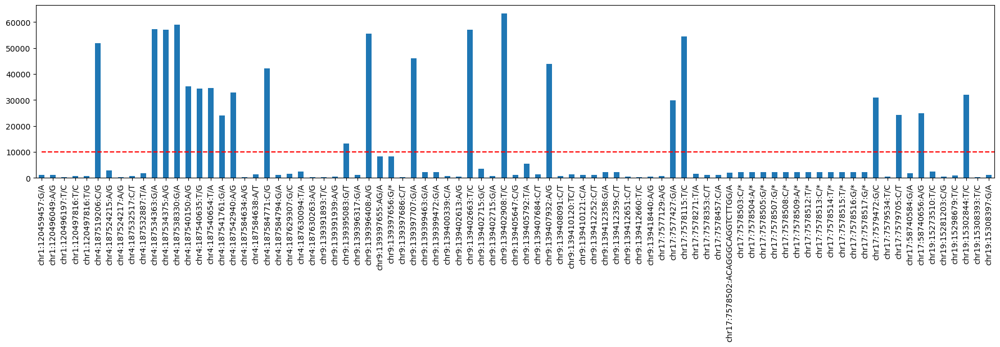

In [4]:
sc.dna.get_attribute('AF', constraint='row+col').sum().plot(kind='bar',figsize=(22,4))
plt.hlines(10000, 0, len(sc.dna.ids()), colors='r', linestyles='dashed')

In [5]:
sc.dna = sc.dna.drop((sc.dna.get_attribute('AF', constraint='row+col').sum() > 20000)[(sc.dna.get_attribute('AF', constraint='row+col').sum() > 10000)].index)

In [6]:
variants = sclib.mission.process_variants(sc, filter_to_cds=False)

In [7]:
variants

,Position,Ref allele,Alt allele,Varsome url,Variant type,RefSeq transcript id,Gene,Protein,cDNA,Coding impact,...,COSMIC ids,HET,HOM,WT,total,MCF,pbVAF,Amplicon,Coverage,Mutated Cells
Variant ID,,,,,,,,,,,,,,,,,,,,,
chr1:120459457:G/A,120459457,G,A,https://varsome.com/variant/hg19/chr1:12045945...,SNV,NM_024408.4,NOTCH2,,c.6028-140C>T,,...,,18.0,6.0,384.0,408.0,5.882353,0.024164,CPD133_DNA_AMP1,37958,24
chr1:120496049:A/G,120496049,A,G,https://varsome.com/variant/hg19/chr1:12049604...,SNV,NM_024408.4,NOTCH2,,c.2365+117T>C,,...,,25.0,3.0,494.0,522.0,5.363985,0.018288,CPD133_DNA_AMP11,75672,28
chr1:120496197:T/C,120496197,T,C,https://varsome.com/variant/hg19/chr1:12049619...,SNV,NM_024408.4,NOTCH2,NOTCH2:p.G778=,c.2334A>G,synonymous,...,,7.0,1.0,513.0,521.0,1.535509,0.006086,CPD133_DNA_AMP11,75672,8
chr1:120497816:T/C,120497816,T,C,https://varsome.com/variant/hg19/chr1:12049781...,SNV,NM_024408.4,NOTCH2,NOTCH2:p.N689S,c.2066A>G,missense,...,,18.0,3.0,409.0,430.0,4.883721,0.015357,CPD133_DNA_AMP12,44750,21
chr1:120497816:T/G,120497816,T,G,https://varsome.com/variant/hg19/chr1:12049781...,SNV,NM_024408.4,NOTCH2,NOTCH2:p.N689T,c.2066A>C,missense,...,,11.0,4.0,416.0,431.0,3.480278,0.013291,CPD133_DNA_AMP12,44750,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chr19:15273510:T/C,15273510,T,C,https://varsome.com/variant/hg19/chr19:1527351...,SNV,NM_000435.3,NOTCH3,,c.5816-137A>G,,...,,110.0,3.0,508.0,621.0,18.196457,0.030396,CPD133_DNA_AMP104,377933,113
chr19:15281203:C/G,15281203,C,G,https://varsome.com/variant/hg19/chr19:1528120...,SNV,NM_000435.3,NOTCH3,NOTCH3:p.D1685H,c.5053G>C,missense,...,,10.0,2.0,343.0,355.0,3.380282,0.014442,CPD133_DNA_AMP106,21649,12
chr19:15298679:T/C,15298679,T,C,https://varsome.com/variant/hg19/chr19:1529867...,SNV,NM_000435.3,NOTCH3,,c.1606+13A>G,,...,,23.0,4.0,460.0,487.0,5.544148,0.017966,CPD133_DNA_AMP113,142856,27


In [8]:
sc.dna=sc.dna[:, sc.dna.filter_variants_consecutive()]

Variants too close to each other:
['1', 120497816]
['1', 120497816]
['4', 187524215]
['4', 187524217]
['4', 187584634]
['4', 187584638]
['9', 139397655]
['9', 139397656]
['9', 139397686]
['9', 139399463]
['9', 139399472]
['9', 139402715]
['9', 139402715]
['9', 139410120]
['9', 139410121]
['9', 139412358]
['9', 139412359]
['9', 139412651]
['9', 139412660]
['17', 7578353]
['17', 7578457]
['17', 7578502]
['17', 7578503]
['17', 7578504]
['17', 7578505]
['17', 7578507]
['17', 7578508]
['17', 7578509]
['17', 7578512]
['17', 7578513]
['17', 7578514]
['17', 7578515]
['17', 7578516]
['17', 7578517]
['19', 15308393]
['19', 15308397]


In [9]:
sc.dna.get_attribute('NGT', constraint='row+col').columns[sc.dna.get_attribute('NGT', constraint='row+col').eq(3).sum()/len(sc.dna.barcodes()) > 0.5].tolist()

['chr9:139412252:C/T', 'chr19:15281203:C/G']

Filter out <50% missing vars

In [10]:
sc.dna = sc.dna.drop(sc.dna.get_attribute('NGT', constraint='row+col').columns[sc.dna.get_attribute('NGT', constraint='row+col').eq(3).sum()/len(sc.dna.barcodes()) > 0.5].tolist())

Filter out <50% missing cells

In [11]:
sc.dna.add_layer('NGT_FILTERED', sc.dna.get_attribute('NGT').values)

In [12]:
sc.dna = sc.dna[sc.dna.filter_barcodes(completeness=50),:]

In [13]:
sc.dna.group_by_genotype(sc.dna.ids(), group_missing=False, min_clone_size=1)

In [14]:
sc.dna.get_attribute('AF',constraint='row+col').applymap(sclib.mission._mgt, detect_frac=25).astype(str).agg("".join, axis=1).value_counts()

0000000000000000000000000    372
0000000000000001000000000     34
0000000100000000000000000     18
0000100000000000000000000     14
0000000000000000000000100     13
                            ... 
0010000000000000000001000      1
0000000100000000010000000      1
0000000000000000000000101      1
0000001000000001000000100      1
0000010000000000100000000      1
Length: 89, dtype: int64

In [15]:
gt_mat = sc.dna.get_attribute('AF',constraint='row+col').applymap(sclib.mission._mgt, detect_frac=25)

In [16]:
gt_mat['gt'] = gt_mat.astype(str).agg("".join, axis=1)

In [17]:
clone_map = {}
for i, geno in enumerate(gt_mat['gt'].unique().tolist()):
    clone_map[geno] = i

In [18]:
clone_map

{'0000000000000000000000000': 0,
 '0000000000000000000000001': 1,
 '0000000100000000000000000': 2,
 '0100000000000000000000000': 3,
 '0000000100000000000001000': 4,
 '0000000000000000000000100': 5,
 '0000001000000000000000000': 6,
 '0000000000000000000000010': 7,
 '0000000000000001000000000': 8,
 '0000000000000000001000000': 9,
 '0000000000000001010000000': 10,
 '0000000010000000000000000': 11,
 '0000100000000000100000000': 12,
 '0000000100000010000000000': 13,
 '0000001100000000000000000': 14,
 '0000011000000000000000000': 15,
 '0000000000000000000010000': 16,
 '0000000000000101000010000': 17,
 '0000000000001000000000000': 18,
 '0000000000100000000000000': 19,
 '0000000000010000000000000': 20,
 '0000100000000001000000000': 21,
 '0000000000000000000100000': 22,
 '0000000100000001000010000': 23,
 '0001000000000000000000000': 24,
 '0000000000000000100000000': 25,
 '0000000001000000000000000': 26,
 '0000000000000000100000100': 27,
 '0000000000000000000001000': 28,
 '0000000000000000000000

In [19]:
gt_mat['clone'] = gt_mat['gt'].map(clone_map)

In [20]:
gt_mat['clone'].values

array([ 0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  2,  3,  4,  3,  5,  0,
        6,  0,  0,  7,  8,  9,  0,  0, 10,  0, 11,  0,  0, 12,  0, 13, 14,
        0,  0,  0,  9, 15,  0,  0,  1,  0,  0,  8,  0, 16,  0,  0, 17,  0,
        0, 18,  0,  0, 19, 20, 21,  0, 22,  0,  2,  0, 23,  0, 16,  0,  0,
        0, 24,  0,  0, 25,  0,  0,  0,  0, 26, 27,  0,  0,  5, 28, 29,  0,
        0, 30,  0,  0,  0,  5,  0,  0,  0, 31,  0, 20,  8,  0,  0,  8,  0,
        2,  0,  3, 32, 19,  0,  0,  0,  0,  6,  0, 33,  0,  0,  0, 25, 19,
       19,  6, 34,  8,  0,  8,  0,  0, 35,  8,  0,  0,  0, 33,  0,  0, 36,
       11,  0,  0,  0,  0,  0, 22,  9, 34, 37, 32, 38, 24,  0,  0, 39,  7,
       33, 32,  0,  0,  2,  0,  0,  5,  0, 21, 20,  0, 25,  0, 40,  0,  0,
        3,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  6,  2,  0,  2,  7, 41,
        9,  2,  0, 32,  0,  0,  0,  0, 28, 20, 26, 26, 42,  0,  0,  0,  0,
        0,  0, 43, 44, 45,  0, 16,  0, 38,  0,  0,  8, 42,  0,  0, 46,  0,
        0,  0, 47, 18, 16

In [21]:
sc.dna.set_labels(gt_mat['clone'].values)

In [22]:
sc.dna.heatmap('AF_MISSING')

FigureWidget({
    'data': [{'colorscale': [[0.0, '#1f77b4'], [0.011235955056179775, '#1f77b4'],
             …

In [23]:
sclib.mission.nan_umap(sc)

array([[-5.5055180e+00, -4.4465251e-03],
       [ 6.6165118e+00,  9.4400311e+00],
       [ 4.4907708e+00,  7.0377789e+00],
       ...,
       [-2.7799871e+00,  1.0232033e+00],
       [ 5.6338973e+00, -1.3985188e+00],
       [ 5.1573992e+00, -8.3246899e+00]], dtype=float32)

In [24]:
sc.dna.run_umap(attribute="AF")

In [25]:
sc.dna.scatterplot('umap', colorby='label')

FigureWidget({
    'data': [{'customdata': array([['label: 0<br>AACACACTCTCGTAATAG-1'],
                      …

In [26]:
sclib.mission.iterative_clone_clustering(sc, macro_custer_size=20, micro_cluster_size=5, niter=5, similarity=0.99, remove_missing=True, detect_frac=20)

c:\Users\johnz\Desktop\mission-sc\notebooks\sclib\mission.py:921: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Unique clusters found - 14
Clusters after removing missing data (on: True) - 6


c:\Users\johnz\Desktop\mission-sc\notebooks\sclib\mission.py:921: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Unique clusters found - 53
Clusters after removing missing data (on: True) - 22


c:\Users\johnz\Desktop\mission-sc\notebooks\sclib\mission.py:921: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Unique clusters found - 54
Clusters after removing missing data (on: True) - 22


c:\Users\johnz\Desktop\mission-sc\notebooks\sclib\mission.py:921: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Unique clusters found - 48
Clusters after removing missing data (on: True) - 23


c:\Users\johnz\Desktop\mission-sc\notebooks\sclib\mission.py:921: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Unique clusters found - 52
Clusters after removing missing data (on: True) - 23


c:\Users\johnz\Desktop\mission-sc\notebooks\sclib\mission.py:921: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Unique clusters found - 51
Clusters after removing missing data (on: True) - 23


In [27]:
sc.dna.heatmap('AF')

FigureWidget({
    'data': [{'colorscale': [[0.0, '#1f77b4'], [0.043478260869565216, '#1f77b4'],
             …

{'icoord': [[215.0, 215.0, 225.0, 225.0],
  [205.0, 205.0, 220.0, 220.0],
  [195.0, 195.0, 212.5, 212.5],
  [185.0, 185.0, 203.75, 203.75],
  [175.0, 175.0, 194.375, 194.375],
  [165.0, 165.0, 184.6875, 184.6875],
  [155.0, 155.0, 174.84375, 174.84375],
  [145.0, 145.0, 164.921875, 164.921875],
  [135.0, 135.0, 154.9609375, 154.9609375],
  [125.0, 125.0, 144.98046875, 144.98046875],
  [115.0, 115.0, 134.990234375, 134.990234375],
  [105.0, 105.0, 124.9951171875, 124.9951171875],
  [95.0, 95.0, 114.99755859375, 114.99755859375],
  [85.0, 85.0, 104.998779296875, 104.998779296875],
  [75.0, 75.0, 94.9993896484375, 94.9993896484375],
  [65.0, 65.0, 84.99969482421875, 84.99969482421875],
  [55.0, 55.0, 74.99984741210938, 74.99984741210938],
  [45.0, 45.0, 64.99992370605469, 64.99992370605469],
  [35.0, 35.0, 54.999961853027344, 54.999961853027344],
  [25.0, 25.0, 44.99998092651367, 44.99998092651367],
  [15.0, 15.0, 34.999990463256836, 34.999990463256836],
  [5.0, 5.0, 24.999995231628418, 2

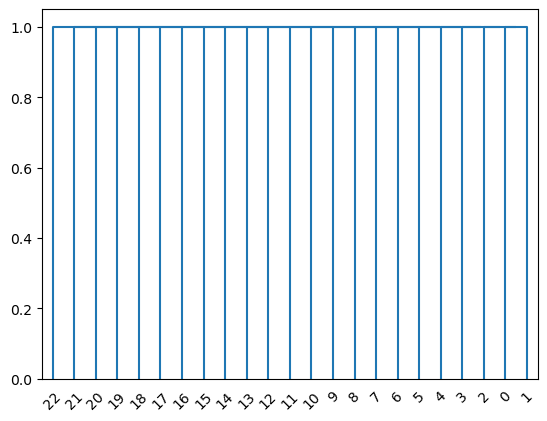

In [28]:
hierarchy.dendrogram(
    hierarchy.linkage(
        distance.pdist(
            sc.dna.get_attribute("AF", constraint="row+col")
            .groupby(sc.dna.get_labels())
            .median()
            .applymap(sclib.mission._mgt, detect_frac=20),
            metric='jaccard'
        ),
        method='complete'
    )
)

In [29]:
tree = hierarchy.to_tree(
    hierarchy.linkage(
        distance.pdist(
            sc.dna.get_attribute("AF", constraint="row+col")
            .groupby(sc.dna.get_labels())
            .mean()
            .applymap(sclib.mission._mgt, detect_frac=20),
            metric='jaccard'
        ),
        method='average',
        optimal_ordering=False
    ),
    rd=False
)

In [30]:
def get_newick(node, parent_dist, leaf_names, newick='') -> str:
    """
    Convert sciply.cluster.hierarchy.to_tree()-output to Newick format.

    :param node: output of sciply.cluster.hierarchy.to_tree()
    :param parent_dist: output of sciply.cluster.hierarchy.to_tree().dist
    :param leaf_names: list of leaf names
    :param newick: leave empty, this variable is used in recursion.
    :returns: tree in Newick format
    """
    if node.is_leaf():
        return "%s:%.2f%s" % (leaf_names[node.id], parent_dist - node.dist, newick)
    else:
        if len(newick) > 0:
            newick = "):%.2f%s" % (parent_dist - node.dist, newick)
        else:
            newick = ");"
        newick = get_newick(node.get_left(), node.dist, leaf_names, newick=newick)
        newick = get_newick(node.get_right(), node.dist, leaf_names, newick=",%s" % (newick))
        newick = "(%s" % (newick)
        return newick

In [31]:
ete_tree = ete3.Tree(get_newick(tree, tree.dist, leaf_names=list(sc.dna.get_attribute("AF", constraint="row+col").groupby(sc.dna.get_labels()).mean().applymap(sclib.mission._mgt, detect_frac=20).index)))

In [32]:
clone_size_dict = sc.dna.get_attribute("AF", constraint="row+col").groupby(sc.dna.get_labels()).size().to_dict()

clone_comp_dict = (
    1
    - sc.dna.get_attribute("NGT", constraint="row+col")[
        sc.dna.get_attribute("NGT", constraint="row+col") == 3
    ].count(axis=1)
    / len(sc.dna.ids())
).groupby(sc.dna.get_labels()).median().to_dict()

gq_dict = sc.dna.get_attribute('GQ',constraint='row+col').groupby(sc.dna.get_labels()).mean().mean(axis=1).to_dict()

mutation_dict = sc.dna.get_attribute('AF',constraint='row+col').groupby(sc.dna.get_labels()).mean().applymap(sclib.mission._mgt, detect_frac=20).apply(lambda row: list(row[row == 1].index), axis=1).to_dict()

In [33]:
ts = ete3.TreeStyle()
ts.show_leaf_name = True
ts.mode = "r"
ts.arc_start = 270 # 0 degrees = 3 o'clock
ts.arc_span = 180

In [34]:
for leaf in ete_tree.traverse():
    if leaf.name in clone_size_dict.keys():
        leaf.add_feature(pr_name='CloneSize', pr_value=clone_size_dict[leaf.name])

for leaf in ete_tree.traverse():
    if leaf.name in clone_size_dict.keys():
        leaf.add_feature(pr_name='GQ', pr_value=int(round(gq_dict[leaf.name])))

for leaf in ete_tree.traverse():
    if leaf.name in mutation_dict.keys():
        leaf.add_feature(pr_name='Variants', pr_value=(mutation_dict[leaf.name]))

for leaf in ete_tree.traverse():
    if leaf.name in clone_comp_dict.keys():
        leaf.add_feature(pr_name='Completeness', pr_value=(clone_comp_dict[leaf.name]))

for leaf in ete_tree.traverse():
    if leaf.name in mutation_dict.keys():
        if leaf.dist==0.5:
            if len(leaf.Variants) == 1:
                leaf.dist = 0
            else:
                leaf.dist = 1
for leaf in ete_tree.traverse():
    if leaf.name in mutation_dict.keys():
        if len(leaf.Variants) == 2 :
            leaf.up.dist = 1
for leaf in ete_tree.traverse():
    if leaf.name in mutation_dict.keys():
        leaf.add_feature(pr_name='vars', pr_value=str(' + '.join(list(variants.loc[mutation_dict[leaf.name]]['Gene'].values)) + ' '))

for leaf in ete_tree.traverse():
    if leaf.name in mutation_dict.keys():
        leaf.add_feature(pr_name='cdna', pr_value=str(' + '.join(list(variants.loc[mutation_dict[leaf.name]][['Gene','cDNA']].apply(":".join, axis=1).values)) + ' '))

In [35]:
col_dict = dict(zip(list(np.unique([leaf.vars for leaf in ete_tree.get_leaves()])),sns.color_palette(palette='Set2', n_colors=len(list(np.unique([leaf.vars for leaf in ete_tree.get_leaves()])))).as_hex()[::-1]))

In [36]:
def tree_layout(node):
    if node.is_leaf():
        # Add node name to laef nodes
        #N = ete3.AttrFace("name", fsize=14, fgcolor="black")
        #ete3.faces.add_face_to_node(N, node, 0)
        V = ete3.AttrFace("cdna", fsize=8, fgcolor="black")
        ete3.faces.add_face_to_node(V, node, 1)
    if "CloneSize" in node.features:
        # Creates a sphere face whose size is proportional to node's
        # feature "weight"
        C = ete3.CircleFace(radius=(node.CloneSize/5), color=col_dict[node.vars], style="sphere")
        # Let's make the sphere transparent
        C.opacity = 0.5
        # And place as a float face over the tree
        ete3.faces.add_face_to_node(C, node, 0, position="branch-right")

In [47]:
ts.layout_fn=tree_layout
ts.show_leaf_name = False

In [48]:
nstyle = ete3.NodeStyle()
nstyle['size'] = 0
for node in ete_tree.traverse():
    node.set_style(nstyle)

In [49]:
ete_tree.set_outgroup('1')

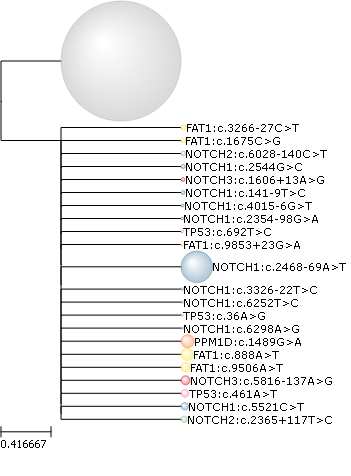

<Figure size 800x1200 with 0 Axes>

In [52]:
plt.figure(figsize=(8,12))
ete_tree.render('%%inline', tree_style=ts,)

In [44]:
paper_pal = {' ': '#b3b3b3', # Anti-Flash White
 'NOTCH1 ': '#5d8aa8', # Air Force Blue
 'NOTCH3 ': '#e32636', # Alizarin Crimson 
 'NOTCH2 ': '#8fbc8f', # Dark Sea Green
 'FAT1 ': '#ffe135', # Banana Yellow
 'TP53 ': '#fc89ac', # Tickled Me Pink
 'PPM1D ': '#ff8243', # Mango Tango
 'THADA/ZFP36L2 ' : '#76ff7a', # Screamin' Green
 'NOTCH1 + TP53 ': '#9966cc', # Amethyst
 'FAT1 + NOTCH1 ': '#0abab5'} # Tiffany Blue

In [45]:
def tree_layout(node):
    if node.is_leaf():
        # Add node name to laef nodes
        #N = ete3.AttrFace("name", fsize=14, fgcolor="black")
        #ete3.faces.add_face_to_node(N, node, 0)
        V = ete3.AttrFace("cdna", fsize=8, fgcolor="black")
        ete3.faces.add_face_to_node(V, node, 1)
    if "CloneSize" in node.features:
        # Creates a sphere face whose size is proportional to node's
        # feature "weight"
        C = ete3.CircleFace(radius=(node.CloneSize/5), color=paper_pal[node.vars], style="sphere")
        # Let's make the sphere transparent
        C.opacity = 0.5
        # And place as a float face over the tree
        ete3.faces.add_face_to_node(C, node, 0, position="branch-right")

In [55]:
plt.figure(figsize=(8,12))
#ete_tree.render('../mb-paper-figs/tree/d43_tree.pdf', tree_style=ts,)

{'nodes': [],
 'faces': [[60.5, 0.5, 181.5, 121.5, 1, None],
  [181.0, 54.5, 185.0, 67.5, 1, ' '],
  [180.5, 124.2, 187.1, 130.8, 3, None],
  [186.6, 121.0, 303.6, 134.0, 3, 'FAT1:c.3266-27C>T '],
  [180.5, 137.6, 186.3, 143.4, 5, None],
  [185.8, 134.0, 285.8, 147.0, 5, 'FAT1:c.1675C>G '],
  [180.5, 150.6, 186.3, 156.4, 7, None],
  [185.8, 147.0, 331.8, 160.0, 7, 'NOTCH2:c.6028-140C>T '],
  [180.5, 163.8, 185.9, 169.20000000000002, 9, None],
  [185.4, 160.0, 307.4, 173.0, 9, 'NOTCH1:c.2544G>C '],
  [180.5, 177.0, 185.5, 182.0, 11, None],
  [185.0, 173.0, 329.0, 186.0, 11, 'NOTCH3:c.1606+13A>G '],
  [180.5, 190.0, 185.5, 195.0, 13, None],
  [185.0, 186.0, 310.0, 199.0, 13, 'NOTCH1:c.141-9T>C '],
  [180.5, 203.4, 184.7, 207.6, 15, None],
  [184.2, 199.0, 316.2, 212.0, 15, 'NOTCH1:c.4015-6G>T '],
  [180.5, 216.6, 184.3, 220.4, 17, None],
  [183.8, 212.0, 323.8, 225.0, 17, 'NOTCH1:c.2354-98G>A '],
  [180.5, 229.6, 184.3, 233.4, 19, None],
  [183.8, 225.0, 276.8, 238.0, 19, 'TP53:c.692T>C 

<Figure size 800x1200 with 0 Axes>

In [93]:
sc.protein.set_labels(sc.dna.get_labels())

ValueError: Row annotations should have 720 elements (got array with (668,))

In [94]:
rna_ids = np.array(
    [
        "COL1A2",
        "JAG1",
        "KRT5",
        "NOTCH3",
        "COL17A1",
        "KRT14",
        "VWF",
        "CD14",
        "CD3E",
        "HES5",
        "BIRC5",
        "HEY1",
        "TOP2A",
        "ITGA6",
        "PTCH1",
        "SPRR3",
        "GLI1",
        "HES7",
        "TP53",
        "KRT23",
        "KLF5",
        "ITGA4",
        "CDH1",
        "S100A8",
        "ITGB4",
        "TP63",
        "CD34",
        "JAG2",
        "KRT4",
        "KRT13",
        "KRT15",
        "EPCAM",
        "MKI67",
        "NGFR",
        "S100A9",
        "SOX2",
        "VIM",
        "LY6D",
        "KLF4",
        "GLI2",
        "HES1",
        "IVL",
        "KRT7",
        "DLL1",
        "SMO",
        "HEY2",
        "HEYL",
        "MAML1",
        "GTSE1",
        "NOTCH1",
        "MAML3",
        "DLL4",
        "DLK2",
        "WNT10A",
        "WNT4",
        "WNT5B",
        "MAML2",
        "ITGB1",
        "WNT7B",
        "PTPRC",
        "DCN",
        "CLEC14A",
        "RBPJ",
        "RBPJ",
        "DLL3",
        "UBE2C",
        "CD24",
    ]
)
sc.protein.col_attrs["id"] = rna_ids
sc.protein = sc.protein.drop("RBPJ")


In [95]:
sclib.mission.makeshift_clr(sc)

In [96]:
sc.protein.heatmap('clr')

FigureWidget({
    'data': [{'colorscale': [[0.0, '#1f77b4'], [1.0, '#1f77b4']],
              'customdata': a…

In [97]:
sc.protein.run_umap('clr')

In [98]:
sc.protein.scatterplot('umap', colorby='label')

FigureWidget({
    'data': [{'customdata': array([['label: -<br>AACACACTCTCGTAATAG-1'],
                      …

In [99]:
sc.protein.scatterplot(
    "umap",
    features=list(
        sc.protein.get_attribute(attribute="clr", constraint="row+col")
        .var()
        .sort_values(ascending=False)
        .head(9)
        .index
    ),
    colorby="clr",
)

In [36]:
sc.protein.signature("clr")

,COL1A2,JAG1,KRT5,NOTCH3,COL17A1,KRT14,VWF,CD14,CD3E,HES5,...,WNT5B,MAML2,ITGB1,WNT7B,PTPRC,DCN,CLEC14A,DLL3,UBE2C,CD24
1,0.0,0.0,4.738951,0.0,0.0,2.418358,0.0,0.574246,1.884997,0.0,...,0.0,0.0,0.0,0.0,3.799140,0.0,3.542596,0.0,0.0,6.911485
10,0.0,0.0,4.240442,0.0,0.0,2.467704,0.0,0.789271,2.157981,0.0,...,0.0,0.0,0.0,0.0,3.874438,0.0,3.327986,0.0,0.0,6.515926
11,0.0,0.0,5.323746,0.0,0.0,2.532718,0.0,0.000000,1.890161,0.0,...,0.0,0.0,0.0,0.0,3.656460,0.0,3.372774,0.0,0.0,6.481712
12,0.0,0.0,4.695270,0.0,0.0,2.680267,0.0,0.336637,1.996761,0.0,...,0.0,0.0,0.0,0.0,3.455234,0.0,3.586392,0.0,0.0,7.055726
13,0.0,0.0,4.323603,0.0,0.0,2.464379,0.0,0.607755,1.706185,0.0,...,0.0,0.0,0.0,0.0,3.496830,0.0,2.897253,0.0,0.0,6.303615
14,0.0,0.0,5.069087,0.0,0.0,2.378576,0.0,0.250008,1.845932,0.0,...,0.0,0.0,0.0,0.0,3.977369,0.0,3.038641,0.0,0.0,6.786286
15,0.0,0.0,4.210851,0.0,0.0,2.690579,0.0,0.000000,1.883517,0.0,...,0.0,0.0,0.0,0.0,3.587439,0.0,4.183166,0.0,0.0,6.802138
16,0.0,0.0,4.849404,0.0,0.0,2.060490,0.0,1.567703,1.667648,0.0,...,0.0,0.0,0.0,0.0,3.612446,0.0,2.822700,0.0,0.0,6.780513
17,0.0,0.0,4.086485,0.0,0.0,3.117595,0.0,0.600333,1.864646,0.0,...,0.0,0.0,0.0,0.0,4.222393,0.0,3.439154,0.0,0.0,5.490557
18,0.0,0.0,4.593327,0.0,0.0,2.999151,0.0,1.047934,1.662382,0.0,...,0.0,0.0,0.0,0.0,3.522722,0.0,3.512653,0.0,0.0,6.125103


In [37]:
sc.protein.signature("clr").loc[:, (sc.protein.signature("clr") != 0).any(axis=0)]

,KRT5,KRT14,CD14,CD3E,TOP2A,ITGA4,CDH1,S100A8,CD34,JAG2,...,KRT15,MKI67,S100A9,SOX2,IVL,SMO,WNT4,PTPRC,CLEC14A,CD24
1,4.738951,2.418358,0.574246,1.884997,0.945317,9.358699,7.792843,2.187999,0.000000,0.586489,...,0.622844,0.000000,0.000000,7.010420,6.735798,0.000000,1.875116,3.799140,3.542596,6.911485
10,4.240442,2.467704,0.789271,2.157981,1.612490,8.547529,7.652157,1.554208,0.838871,0.742853,...,1.202920,0.000000,0.000000,6.447518,6.291402,0.000000,2.786668,3.874438,3.327986,6.515926
11,5.323746,2.532718,0.000000,1.890161,0.976083,8.176898,7.341101,3.577677,0.000000,1.013771,...,0.532656,0.000000,0.000000,6.049078,6.776105,0.000000,2.277658,3.656460,3.372774,6.481712
12,4.695270,2.680267,0.336637,1.996761,1.063302,8.253715,7.711173,3.200448,0.000000,0.441097,...,0.986232,0.000000,0.000000,7.015092,7.318424,0.000000,3.456868,3.455234,3.586392,7.055726
13,4.323603,2.464379,0.607755,1.706185,1.118047,8.009895,6.858382,5.300358,0.696897,1.100612,...,1.310305,0.000000,0.742340,6.137727,6.345214,0.000000,2.572217,3.496830,2.897253,6.303615
14,5.069087,2.378576,0.250008,1.845932,0.948301,8.492978,7.302412,3.339602,0.283792,0.000000,...,0.769859,0.000000,0.274794,6.732858,6.018256,0.000000,1.974487,3.977369,3.038641,6.786286
15,4.210851,2.690579,0.000000,1.883517,0.674986,9.826237,7.898459,2.396912,1.015858,0.674986,...,1.069828,0.610032,0.000000,6.153901,6.560455,0.000000,2.024959,3.587439,4.183166,6.802138
16,4.849404,2.060490,1.567703,1.667648,1.012950,8.701255,7.175175,2.186499,0.000000,0.000000,...,1.289124,0.000000,0.733961,5.661071,6.242423,0.000000,1.958558,3.612446,2.822700,6.780513
17,4.086485,3.117595,0.600333,1.864646,2.043243,7.744754,7.065498,3.550386,0.770454,0.000000,...,1.200665,0.000000,0.000000,5.853147,6.091698,0.000000,1.393929,4.222393,3.439154,5.490557
18,4.593327,2.999151,1.047934,1.662382,1.626810,9.508165,7.744750,2.698636,0.406703,0.628948,...,0.708796,0.000000,0.000000,7.362510,6.808426,0.000000,1.999434,3.522722,3.512653,6.125103


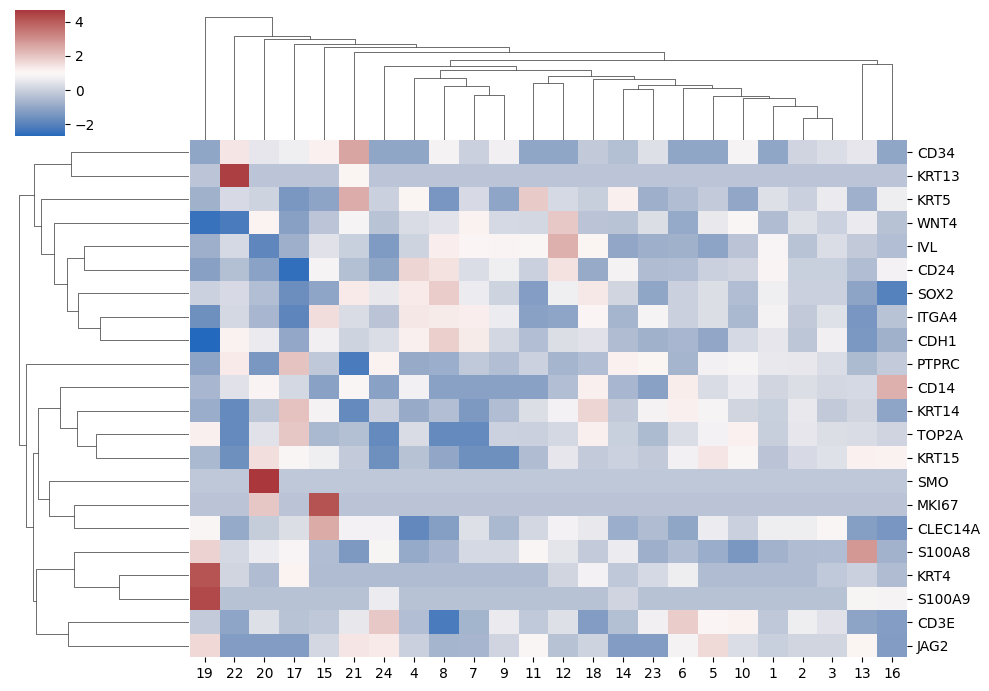

In [38]:
sns.clustermap(
    sc.protein.signature("clr").loc[:, (sc.protein.signature("clr") != 0).any(axis=0)].T, cmap="vlag", z_score=0, figsize=(10, 7)
)

In [39]:
sc.cnv.get_gene_names()

Fetching annotation for amplicons.
Added gene names to the "gene_name" column attribute


In [40]:
counts = pd.DataFrame(sc.cnv.layers['read_counts'],index=sc.cnv.barcodes(),columns=sc.cnv.ids())
saturation_df = sclib.gpu.cupy_saturation_analysis_per_amp(counts, list(np.arange(0.01,1,0.001)),8,1)
sclib.mission.saturation_plot_smooth(sc, saturation_df)

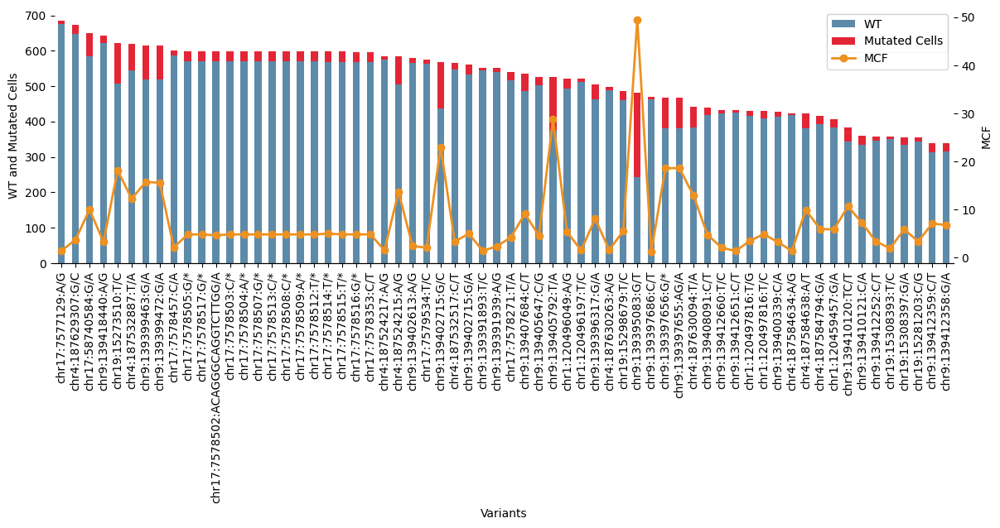

In [44]:
sclib.mission.plot_stacked_barchart_and_line(variants.sort_values(by='total', ascending=False))

In [100]:
"""with open('d43_clustered_v3.pkl', 'wb') as f:
    pickle.dump(sc, f)"""